# Group 22

## Section 0: TA feedback
- **Mechanics**: 3/3 pts
- **Reasoning**: 9/12 pts - need mathematical justification when excluding variables due to "high correlation"
- **Writing**: 2.4/3 pts - need more comments in code
- **Visualisation**: 6/12 pts - you are not asked to fit a model in this assignment. and logistic regression plots are not very informative for EDA

## Section 1: Data Description 

#### 1. Summary
The dataset contains 12,330 sessions (observations) collected from an online retail store over one year, with each session representing a unique visitor to avoid bias from specific users or campaigns. It was designed as a binary classification problem where the goal is to predict whether a visitor completed a purchase (Revenue = 1) or not (Revenue = 0). Around 84.5% of the sessions did not end with a purchase, while 15.5% did.

There were 18 variables recorded: 

**a. Numerical variables**
- Administrative / Administrative_Duration – Number and total time of visits to administrative pages (e.g., account or policy pages).
- Informational / Informational_Duration – Number and total time of visits to informational pages (e.g., FAQs, contact, or help pages).
- ProductRelated / ProductRelated_Duration – Number and total time of visits to product-related pages (e.g., browsing or comparing products).
- BounceRate – Percentage of visitors who left the site after viewing only one page.
- ExitRate – Percentage of pageviews that were the last interaction in a session.
- PageValue – Average value of pages visited before a purchase, indicating how close the visitor was to completing a transaction.
- SpecialDay – Proximity of the visit date to a special day (e.g., Valentine’s Day or Mother’s Day), ranging from 0 (not near) to 1 (closest).

**b. Categorical variables** 
- OperatingSystems – Type of operating system used (e.g., Windows, Mac, Linux).
- Browser – Browser type used by the visitor (e.g., Chrome, Safari, Firefox).
- Region – Geographic region or location of the visitor.
- TrafficType – Source of traffic to the site (e.g., direct, referral, advertisement).
- VisitorType – Indicates whether the visitor is New or Returning.
- Weekend – Logical variable showing if the session occurred on a weekend (TRUE/FALSE).
- Month – Month of the visit (e.g., Feb, Mar, etc.).
- Revenue – Target variable; indicates whether the session resulted in a purchase (TRUE = purchase).
  
#### 2. Source and Information
**Data source**: The dataset was originally collected and published by C. O. Sakar, S. Polat, M. Katircioglu, and Y. Kastro for the study “Real-time prediction of online shoppers’ purchasing intention using multilayer perceptron and LSTM recurrent neural networks” (Neural Computing and Applications, 2019). The data were gathered from an online retail website’s transaction logs and it was formed so that each session would belong to a different user in a 1-year period to avoid any tendency to a specific campaign, special day, user profile, or period. 

**Citation**:
Sakar, C. O., Polat, S., Katircioglu, M., & Kastro, Y. (2019). Real-time prediction of online shoppers’ purchasing intention using multilayer perceptron and LSTM recurrent neural networks. Neural Computing and Applications. https://doi.org/10.1007/s00521-018-3523-0

#### 3. Pre-selection of variables 

PageValues, SpecialDay, Weekend, and VisitorType were **selected** because they capture user engagement, timing, and visit type, as these factors are likely to influence purchase decisions. 

<mark>**Excluded variables**:

1. One in each of the following pairs will be removed, as they measure the same underlying concept (counts, time):  
    - Administrative & Administrative_Duration
    - Informational & Informational_Duration
    - ProductRelated & ProductRelated_Duration


2. OperatingSystems, Browser, Region, TrafficType may also be excluded because they describe technical session attributes rather than user behavior.

## Section 2: Scientific Question
**Question**:
We want to examine the association between whether an online shopper completes a purchase during a browsing session based on revenue (response) and predictors related to user behavior (e.g., page value) and contextual factors (e.g. proximity to a special day, whether the visit occurs on a weekend, and visitor type: returning vs new).

The **response variable** is Revenue. 

This question is primarily **predictive**: behavioral and temporal features are used to estimate the probability that a shopper will complete a purchase.

## Section 3: Exploratory Data Analysis and Visualization 

In [1]:
library(readr)
library(dplyr)
library(tidyverse)
library(broom)
library(modelr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘modelr’


The following object is masked from ‘package:broom’:

    bootstrap




In [2]:
# Load the dataset containing online shopping session information
purchasing_int <- read_csv("online_shoppers_intention.csv")

Rows: 12330 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): Month, VisitorType
dbl (14): Administrative, Administrative_Duration, Informational, Informatio...
lgl  (2): Weekend, Revenue

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [3]:
# Data wrangling to factors for plotting and modeling
data <- purchasing_int %>%
  mutate(
    Revenue = as.factor(Revenue),         # Convert purchase outcome (TRUE/FALSE) to factor
    Weekend = as.factor(Weekend),         # Convert weekend indicator (TRUE/FALSE) to factor
    VisitorType = as.factor(VisitorType)  # Convert visitor category to factor
  )

### <mark>Visualization

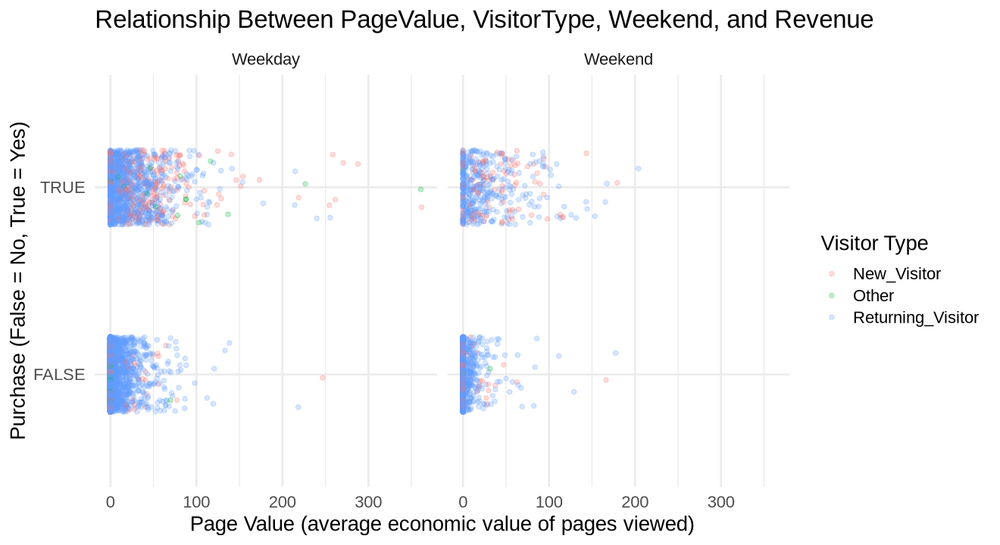

In [4]:
# Create exploratory plot showing the relationship between Page Value,
# purchase outcome, visitor type, and weekend status

# Set plot dimensions
options(repr.plot.width = 11, repr.plot.height = 6)

plot_EDA <- 
  ggplot(data, aes(x = PageValues, y = Revenue, color = VisitorType)) +
  # Add jitter to avoid overplotting of binary outcome values
  geom_jitter(alpha = 0.25, width = 0, height = 0.2) +
  # Facet by weekend status
  facet_wrap(~ Weekend, labeller = as_labeller(c(`TRUE` = "Weekend", `FALSE` = "Weekday"))) +
  # Add plot labels
  labs(
    title = "Relationship Between PageValue, VisitorType, Weekend, and Revenue",
    x = "Page Value (average economic value of pages viewed)",
    y = "Purchase (False = No, True = Yes)",   
    color = "Visitor Type") + theme_minimal(base_size = 16.5)

# Print plot
plot_EDA

### <mark>Interpretations: 

The visualisation above explores the relationships among selected variables: PageValue, VisitorType, Weekend/Weekday, and Revenue. It allows to visually identify how page engagement differs across visitor types and whether the purchasing patterns are different on the weekdays.

**Results:**
 - Across both weekends and weekdays, purchased sessions (Revenue = TRUE) show higher PageValue than non-purchased sessions.
 - New visitors appear more spread out toward higher PageValue values than returning visitors
 - Weekend and weekday patterns look broadly similar

**What can we learn from this visualization?**
- The plot suggests that PageValue is likely a strong predictor of purchase intent (purchased sessions consistently cluster around higher values).
- VisitorType also noticeably separates behaviors (new visitors showing higher variation in PageValue).
- Weekend status does not show large differences, so it may have a weaker role in predicting purchases.

Overall, this visualization helps identify which predictors should be prioritized in the later models.

## Section 4: Method and Plan

A **logistic regression model** will be used to address the research question: whether PageValue, VisitorType, Weekend status, and proximity to a Special Day are associated with the likelihood of purchase. The response variable (Revenue) is binary and the method allows to estimate how behavioral and contextual predictors influence the probability of purchase, therefore, logistic regression is the most convenient model for this case.

**Assumptions**:
-  observations are independent
-  the log-odds of purchase are a linear function of the predictors
-  minimal multicollinearity among selected predictors

**Limitations**:
- may not capture complex nonlinear relationships or interactions
- may be sensitive to class imbalance, as only a small proportion of sessions result in a purchase

## Section 5: Computational Code and Output

In [5]:
# Fit a logistic regression model to estimate purchase probability
# using PageValues, SpecialDay, Weekend, and VisitorType as predictors
model <- glm(Revenue ~ PageValues + SpecialDay + Weekend + VisitorType,
             data = data, family = binomial)
# Display tidy summary of model coefficients
tidy(model)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-2.04725969,0.078017091,-26.241169,9.014911e-152
PageValues,0.08789804,0.002356202,37.304973,1.363060e-304
SpecialDay,-1.18249330,0.214613656,-5.509870,3.590992e-08
WeekendTRUE,0.18749332,0.068794885,2.725396,6.422438e-03
VisitorTypeOther,-1.00874718,0.497084075,-2.029329,4.242478e-02
VisitorTypeReturning_Visitor,-0.41667011,0.080150870,-5.198573,2.008248e-07


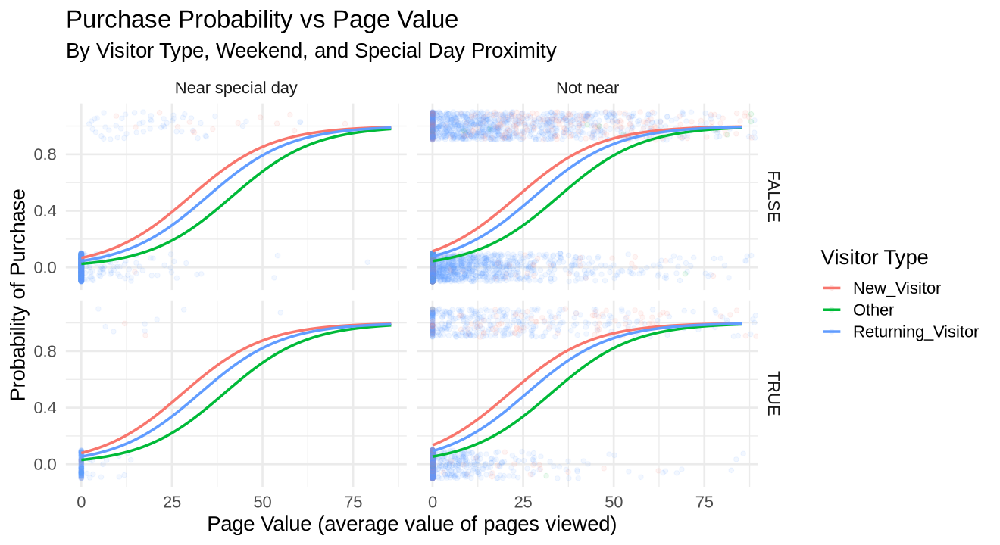

In [6]:
# Label special-day categories for faceting
facet_vals <- tibble(
  SpecialDay2 = c("Near special day", "Not near"),
  SpecialDay  = c(0.5, 0.0)                         # Values used in prediction grid
)

# Determine an upper limit for PageValues to avoid extreme outliers in the plot
x_max <- quantile(data$PageValues, 0.99, na.rm = TRUE)

# Create a grid of values for predictions across PageValues and categorical variables
data_for_plotting <- 
  tibble(PageValues = seq(0, x_max, length.out = 400)) %>%    # Smooth curve
  crossing(      
    VisitorType = levels(data$VisitorType),                   # All visitor types
    Weekend     = levels(data$Weekend)                        # Weekend/weekday
  ) %>%
  crossing(facet_vals) %>%                                    # Special Day categories
  add_predictions(model, var = "pred", type = "response")     # Add predicted probabilities

# Set plot dimensions
options(repr.plot.width = 11, repr.plot.height = 6)

# Generate visualization 
data %>%
  # Label special days
  mutate(SpecialDay2 = if_else(SpecialDay > 0, "Near special day", "Not near")) %>%   
  # Map purchase & visitor type
  ggplot(aes(PageValues, as.numeric(Revenue) - 1, color = VisitorType)) +
  geom_jitter(alpha = 0.08, width = 0, height = 0.1) +
  # Predicted probability curves
  geom_line(aes(y = pred), data = data_for_plotting, linewidth = 1) +
  # Facet by Weekend and Special Day 
  facet_grid(Weekend ~ SpecialDay2) +
  # Keep consistent x-range
  coord_cartesian(xlim = c(0, x_max)) +
  labs(
    title = "Purchase Probability vs Page Value",
    subtitle = "By Visitor Type, Weekend, and Special Day Proximity",
    x = "Page Value (average value of pages viewed)",
    y = "Probability of Purchase",
    color = "Visitor Type"
  ) + theme_minimal(base_size = 16.5)

The logistic regression results show that higher PageValue is strongly associated with a greater probability of purchase, confirming that users who interact with higher-value pages are more likely to convert. 

Unexpectedly, the model indicates slightly higher purchase probabilities when sessions are not near a SpecialDay; this may suggest that special day traffic indicates more scrolling behaviour and less actual buyers. 

New visitors show higher predicted purchase probabilities than returning visitors at comparable PageValue levels, while weekend status adds minimal explanatory value.


Overall, the model suggests that PageValue and visitor type are the main behavioural predictors of purchase likelihood in this dataset.